In [1]:
# !pip install visdom

## Imports

### Standard Imports

In [2]:
from __future__ import print_function
from __future__ import division

from PIL import Image

import matplotlib.pyplot as plt
import numpy as np

import argparse
import copy
import datetime
import os
import random
import skimage
import shutil
import time
# import visdom
import warnings

### Torch imports

In [3]:
import torch
import torchvision

import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset

from torchvision import datasets
from torchvision import transforms
from torchvision.transforms import Resize, Compose, ToTensor, Normalize

## Set seeds for repeatability

In [4]:
print("PyTorch Version: ",torch.__version__)
print("Torchvision Version: ",torchvision.__version__)

PyTorch Version:  1.6.0+cu101
Torchvision Version:  0.7.0+cu101


In [5]:
torch.manual_seed(0)
np.random.seed(0)
random.seed(0)

torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

feature_extract = True

## Custom Argparser

In [6]:
parser = argparse.ArgumentParser(description='PyTorch SirenNet Training')
"""parser.add_argument('data', metavar='DIR',
                    help='path to dataset')"""
parser.add_argument('--epochs', default=90, type=int, metavar='N',
                    help='number of total epochs to run')
parser.add_argument('--start-epoch', default=0, type=int, metavar='N',
                    help='manual epoch number (useful on restarts)')
parser.add_argument('-b', '--batch-size', default=256, type=int,
                    metavar='N',
                    help='mini-batch size (default: 256), this is the total '
                         'batch size of all GPUs on the current node when '
                         'using Data Parallel or Distributed Data Parallel')
parser.add_argument('--lr', '--learning-rate', default=0.1, type=float,
                    metavar='LR', help='initial learning rate', dest='lr')
parser.add_argument('--momentum', default=0.9, type=float, metavar='M',
                    help='momentum')
parser.add_argument('--wd', '--weight-decay', default=1e-4, type=float,
                    metavar='W', help='weight decay (default: 1e-4)',
                    dest='weight_decay')
parser.add_argument('-p', '--print-freq', default=10, type=int,
                    metavar='N', help='print frequency (default: 10)')
parser.add_argument('-e', '--evaluate', dest='evaluate', action='store_true',
                    help='evaluate model on validation set')
parser.add_argument('--seed', default=None, type=int,
                    help='seed for initializing training. ')
parser.add_argument('--gpu', default=None, type=int,
                    help='GPU id to use.')

_StoreAction(option_strings=['--gpu'], dest='gpu', nargs=None, const=None, default=None, type=<class 'int'>, choices=None, help='GPU id to use.', metavar=None)

## Set device - either gpu:0 or cpu

In [7]:
# Detect if we have a GPU available
# device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device = (torch.device('cuda:0') if torch.cuda.is_available()
    else torch.device('gpu'))
print(f"Training on device {device}.")
print(f"# cuda device: {torch.cuda.device_count()}")
print(f"Id current device: {torch.cuda.current_device()}")

Training on device cuda:0.
# cuda device: 1
Id current device: 0


## Siren Hyper-parameters

In [8]:
# Siren's architecture Hyper-params
in_features = 2
out_features = 1
sidelength = 128
hidden_layers = 3

# Training phase's Hyper-params
learning_rate = 1e-4

# Displaying Images
steps_til_summary = 10

image_path = "/content/drive/My Drive/Siren Deep Learning Analyses/testsets/BSD68/test001.png"

## Functions

In [9]:
def get_mgrid(sidelen, dim=2):
    '''Generates a flattened grid of (x,y,...) coordinates in a range of -1 to 1.
    sidelen: int
    dim: int'''
    tensors = tuple(dim * [torch.linspace(-1, 1, steps=sidelen)])
    mgrid = torch.stack(torch.meshgrid(*tensors), dim=-1)
    mgrid = mgrid.reshape(-1, dim)
    return mgrid

In [10]:
def show_images(model_output, coords):
    img_grad = gradient(model_output, coords)
    img_laplacian = laplace(model_output, coords)

    fig, axes = plt.subplots(1,3, figsize=(18,6))
    axes[0].imshow(model_output.cpu().view(sidelength, sidelength).detach().numpy())
    axes[1].imshow(img_grad.norm(dim=-1).cpu().view(sidelength, sidelength).detach().numpy())
    axes[2].imshow(img_laplacian.cpu().view(sidelength, sidelength).detach().numpy())
    plt.show()
    pass

def basic_traininig_loop(optimizer, criterion, model, model_input, ground_truth, total_steps, steps_til_summary = 10):
    
    train_acc_history = [] # val_acc_history = []
    train_loss_history = [] # val_loss_history = []

    best_model_wts = copy.deepcopy(model.state_dict())

    model.train()  # Set model to training mode

    for step in range(total_steps):
        # print('Epoch {}/{}'.format(step, total_steps - 1))
        # print('-' * 10)

        model_output, coords = model(model_input)
        loss = criterion(model_output, ground_truth)  
        # loss = ((model_output - ground_truth)**2).mean()
    
        if not step % steps_til_summary:
            print("Step %d, Total loss %0.6f" % (step, loss))
            show_images(model_output, coords)
            pass
        
        train_loss_history.append(loss)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        best_model_wts = copy.deepcopy(model.state_dict())
        pass
    

    # load best model weights
    model.load_state_dict(best_model_wts)

    # create history as python dictionary
    keys_history_list = "train_loss".split(",")
    values_history_list = [train_loss_history]

    history = dict(zip(keys_history_list, values_history_list))

    return model, history

In [11]:
def plane_traininig_loop(optimizer, criterion, model, model_input, ground_truth, total_steps):
    
    train_acc_history = [] # val_acc_history = []
    train_loss_history = [] # val_loss_history = []

    best_model_wts = copy.deepcopy(model.state_dict())

    model.train()  # Set model to training mode

    phase = 'train'
    for step in range(total_steps):
        print('Epoch {}/{}'.format(step, total_steps - 1))
        print('-' * 10)

        model_output, coords = model(model_input)    
        loss = criterion(model_output, ground_truth)
        # loss = ((model_output - ground_truth)**2).mean()
        

        print('{} Loss: {:.4f}'.format(phase, loss))
        train_loss_history.append(loss)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        best_model_wts = copy.deepcopy(model.state_dict())
        pass
    

    # load best model weights
    model.load_state_dict(best_model_wts)

    # create history as python dictionary
    keys_history_list = "train_loss".split(",")
    values_history_list = [train_loss_history]

    history = dict(zip(keys_history_list, values_history_list))

    return model, history

## Siren classes

Now, we code up the sine layer, which will be the basic building block of SIREN. This is a much more concise implementation than the one in the main code, as here, we aren't concerned with the baseline comparisons.

In [12]:
class SineLayer(nn.Module):
    # See paper sec. 3.2, final paragraph, and supplement Sec. 1.5 for discussion of omega_0.
    
    # If is_first=True, omega_0 is a frequency factor which simply multiplies the activations before the 
    # nonlinearity. Different signals may require different omega_0 in the first layer - this is a 
    # hyperparameter.
    
    # If is_first=False, then the weights will be divided by omega_0 so as to keep the magnitude of 
    # activations constant, but boost gradients to the weight matrix (see supplement Sec. 1.5)
    
    def __init__(self, in_features, out_features, bias=True,
                 is_first=False, omega_0=30):
        super().__init__()
        self.omega_0 = omega_0
        self.is_first = is_first
        
        self.in_features = in_features
        self.linear = nn.Linear(in_features, out_features, bias=bias)
        
        self.init_weights()
    
    def init_weights(self):
        with torch.no_grad():
            if self.is_first:
                self.linear.weight.uniform_(-1 / self.in_features, 
                                             1 / self.in_features)      
            else:
                self.linear.weight.uniform_(-np.sqrt(6 / self.in_features) / self.omega_0, 
                                             np.sqrt(6 / self.in_features) / self.omega_0)
        
    def forward(self, input):
        return torch.sin(self.omega_0 * self.linear(input))
    
    def forward_with_intermediate(self, input): 
        # For visualization of activation distributions
        intermediate = self.omega_0 * self.linear(input)
        return torch.sin(intermediate), intermediate
    
    
class Siren(nn.Module):
    def __init__(self, in_features, hidden_features, hidden_layers, out_features, outermost_linear=False, 
                 first_omega_0=30, hidden_omega_0=30.):
        super().__init__()
        
        self.net = []
        self.net.append(SineLayer(in_features, hidden_features, 
                                  is_first=True, omega_0=first_omega_0))

        for i in range(hidden_layers):
            self.net.append(SineLayer(hidden_features, hidden_features, 
                                      is_first=False, omega_0=hidden_omega_0))

        if outermost_linear:
            final_linear = nn.Linear(hidden_features, out_features)
            
            with torch.no_grad():
                final_linear.weight.uniform_(-np.sqrt(6 / hidden_features) / hidden_omega_0, 
                                              np.sqrt(6 / hidden_features) / hidden_omega_0)
                
            self.net.append(final_linear)
        else:
            self.net.append(SineLayer(hidden_features, out_features, 
                                      is_first=False, omega_0=hidden_omega_0))
        
        self.net = nn.Sequential(*self.net)
    
    def forward(self, coords):
        coords = coords.clone().detach().requires_grad_(True) # allows to take derivative w.r.t. input
        output = self.net(coords)
        return output, coords        

    def forward_with_activations(self, coords, retain_grad=False):
        '''Returns not only model output, but also intermediate activations.
        Only used for visualizing activations later!'''
        activations = OrderedDict()

        activation_count = 0
        x = coords.clone().detach().requires_grad_(True)
        activations['input'] = x
        for i, layer in enumerate(self.net):
            if isinstance(layer, SineLayer):
                x, intermed = layer.forward_with_intermediate(x)
                
                if retain_grad:
                    x.retain_grad()
                    intermed.retain_grad()
                    
                activations['_'.join((str(layer.__class__), "%d" % activation_count))] = intermed
                activation_count += 1
            else: 
                x = layer(x)
                
                if retain_grad:
                    x.retain_grad()
                    
            activations['_'.join((str(layer.__class__), "%d" % activation_count))] = x
            activation_count += 1

        return activations

And finally, differential operators that allow us to leverage autograd to compute gradients, the laplacian, etc.

In [13]:
def laplace(y, x):
    grad = gradient(y, x)
    return divergence(grad, x)


def divergence(y, x):
    div = 0.
    for i in range(y.shape[-1]):
        div += torch.autograd.grad(y[..., i], x, torch.ones_like(y[..., i]), create_graph=True)[0][..., i:i+1]
    return div


def gradient(y, x, grad_outputs=None):
    if grad_outputs is None:
        grad_outputs = torch.ones_like(y)
    grad = torch.autograd.grad(y, [x], grad_outputs=grad_outputs, create_graph=True)[0]
    return grad

## Experiments

For the image fitting and poisson experiments, we'll use the classic cameraman image.

In [44]:
def printImageAttributes(imageObject, imagePath):

    # Retrieve the attributes of the image

    fileFormat      = imageObject.format        # Format of the image
    imageMode       = imageObject.mode          # Mode of the image
    imageSize       = imageObject.size          # Size of the image - tupe of (width, height)
    colorPalette    = imageObject.palette       # Palette used in the image

    # Print the attributes of the image
    print("Attributes of image:%s"%imagePath)

    print("The file format of the image is:%s"%fileFormat)

    print("The mode of the image is:%s"%imageMode)

    print("The size of the image is:width %d pixels,height %d pixels"%imageSize)

    print("Color palette used in image:%s"%colorPalette)

    print("Keys from image.info dictionary:%s")

    for key, value in imageObject.info.items() :
        print(key)
        print(value)
        pass
    pass

def get_cameraman_tensor(sidelength):
    print(type(skimage.data.camera()))
    img = Image.fromarray(skimage.data.camera())
    
    print(type(img))
    printImageAttributes(img, "cameraman")

    transform = Compose([
        Resize(sidelength),
        ToTensor(),
        Normalize(torch.Tensor([0.5]), torch.Tensor([0.5]))
    ])
    img = transform(img)
    return img

### Fitting an image

First, let's simply fit that image!

We seek to parameterize a greyscale image $f(x)$ with pixel coordinates $x$ with a SIREN $\Phi(x)$.

That is we seek the function $\Phi$ such that: $\mathcal{L}=\int_{\Omega} \lVert \Phi(\mathbf{x}) - f(\mathbf{x}) \rVert\mathrm{d}\mathbf{x}$ is minimized, in which $\Omega$ is the domain of the image.

We write a little datast that does nothing except calculating per-pixel coordinates:

In [45]:
class ImageFitting(Dataset):
    def __init__(self, sidelength, image_path = None):
        super().__init__()
        if image_path is None:
            img = get_cameraman_tensor(sidelength)
        else:
            imag = Image.open(image_path)
            imag = imag.resize((sidelength, sidelength))
            printImageAttributes(imag, image_path)
            # imag = np.asarray(imag)
            transform = Compose([
                Resize(sidelength),
                ToTensor(),
                Normalize(torch.Tensor([0.5]), torch.Tensor([0.5]))
            ])
            img = transform(imag)
            pass
        
        print(type(img))
        print(img.size())

        self.pixels = img.permute(1, 2, 0).view(-1, 1)
        self.coords = get_mgrid(sidelength, 2)
        pass

    def __len__(self):
        return 1

    def __getitem__(self, idx):    
        if idx > 0: raise IndexError
            
        return self.coords, self.pixels
    pass

Let's instantiate the dataset and our Siren. As pixel coordinates are 2D, the siren has 2 input features, and since the image is grayscale, it has one output channel.

In [48]:
cameraman = ImageFitting(sidelength, image_path = image_path)

Attributes of image:/content/drive/My Drive/Siren Deep Learning Analyses/testsets/BSD68/test001.png
The file format of the image is:None
The mode of the image is:L
The size of the image is:width 128 pixels,height 128 pixels
Color palette used in image:None
Keys from image.info dictionary:%s
<class 'torch.Tensor'>
torch.Size([1, 128, 128])


In [49]:
# cameraman = ImageFitting(sidelength)
dataloader = DataLoader(cameraman, batch_size=1, pin_memory=True, num_workers=0)

In [50]:
len(dataloader)

1

In [51]:
img_siren = Siren(
    in_features = in_features,
    out_features = out_features,
    hidden_features = sidelength, 
    hidden_layers = hidden_layers,
    outermost_linear=True)
img_siren.cuda()

Siren(
  (net): Sequential(
    (0): SineLayer(
      (linear): Linear(in_features=2, out_features=128, bias=True)
    )
    (1): SineLayer(
      (linear): Linear(in_features=128, out_features=128, bias=True)
    )
    (2): SineLayer(
      (linear): Linear(in_features=128, out_features=128, bias=True)
    )
    (3): SineLayer(
      (linear): Linear(in_features=128, out_features=128, bias=True)
    )
    (4): Linear(in_features=128, out_features=1, bias=True)
  )
)

In [52]:
model = img_siren.to(device)

numel_list = [p.numel() for p in model.parameters() if p.requires_grad == True]
print(model)
print(sum(numel_list), numel_list)

Siren(
  (net): Sequential(
    (0): SineLayer(
      (linear): Linear(in_features=2, out_features=128, bias=True)
    )
    (1): SineLayer(
      (linear): Linear(in_features=128, out_features=128, bias=True)
    )
    (2): SineLayer(
      (linear): Linear(in_features=128, out_features=128, bias=True)
    )
    (3): SineLayer(
      (linear): Linear(in_features=128, out_features=128, bias=True)
    )
    (4): Linear(in_features=128, out_features=1, bias=True)
  )
)
50049 [256, 128, 16384, 128, 16384, 128, 16384, 128, 128, 1]



We now fit Siren in a simple training loop. Within only hundreds of iterations, the image and its gradients are approximated well.

In [53]:
model = img_siren.to(device)

params_to_update = model.parameters()
print("Params to learn:")
if feature_extract:
    params_to_update = []
    for name,param in model.named_parameters():
        if param.requires_grad == True:
            params_to_update.append(param)
            print("\t",name)
else:
    for name,param in model.named_parameters():
        if param.requires_grad == True:
            print("\t",name)

Params to learn:
	 net.0.linear.weight
	 net.0.linear.bias
	 net.1.linear.weight
	 net.1.linear.bias
	 net.2.linear.weight
	 net.2.linear.bias
	 net.3.linear.weight
	 net.3.linear.bias
	 net.4.weight
	 net.4.bias


In [54]:
total_steps = 500 # Since the whole image is our dataset, this just means 500 gradient descent steps.

criterion = nn.MSELoss()
optim = torch.optim.Adam(lr=1e-4, params=img_siren.parameters())

model_input, ground_truth = next(iter(dataloader))
model_input, ground_truth = model_input.cuda(), ground_truth.cuda()

Step 0, Total loss 0.242973


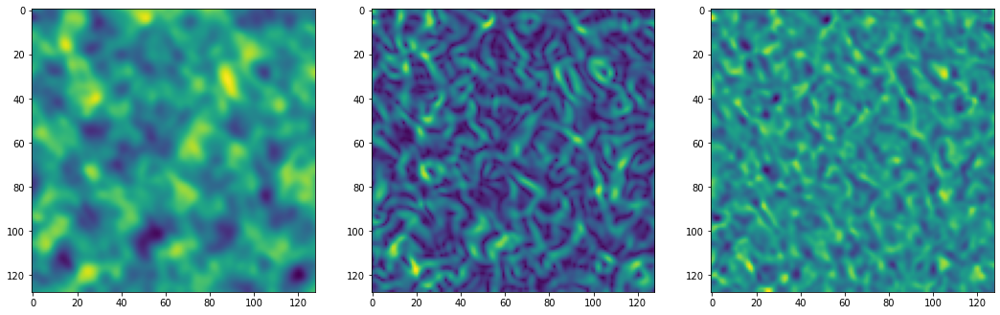

Step 10, Total loss 0.120187


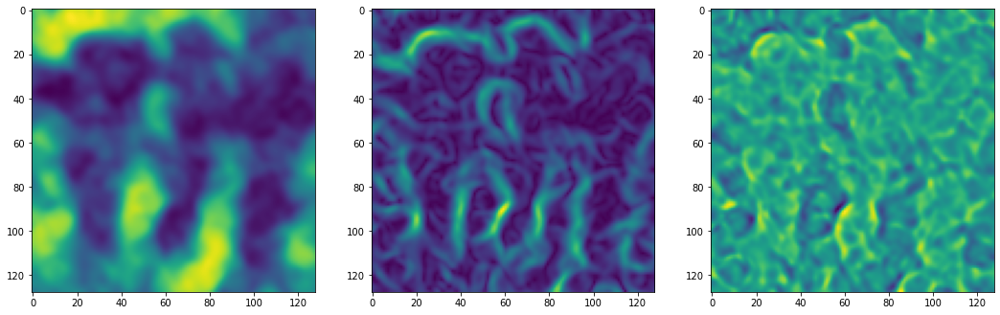

Step 20, Total loss 0.055856


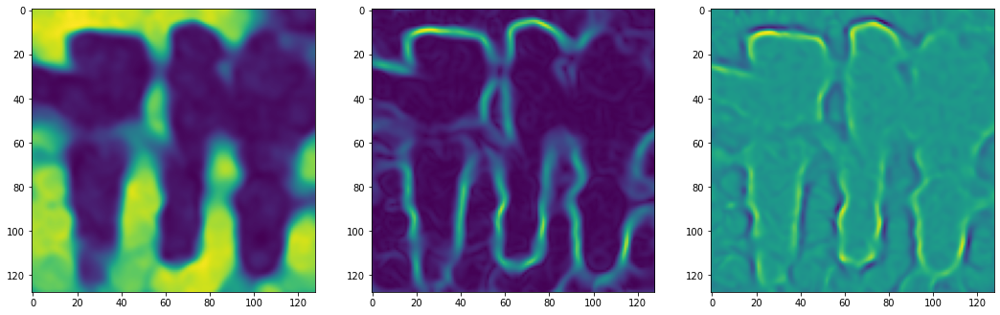

Step 30, Total loss 0.038487


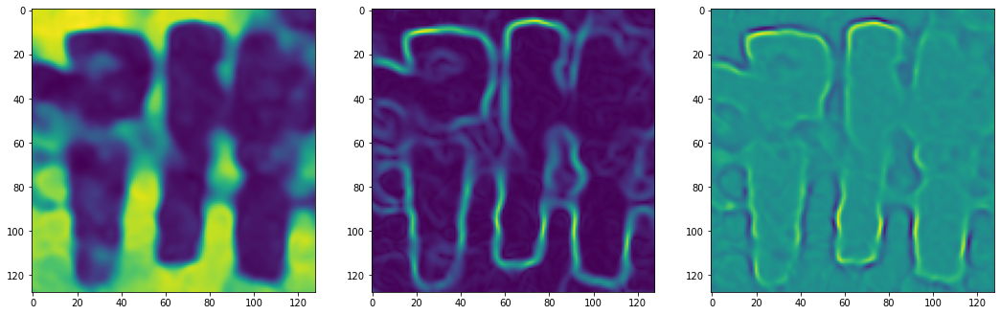

Step 40, Total loss 0.029451


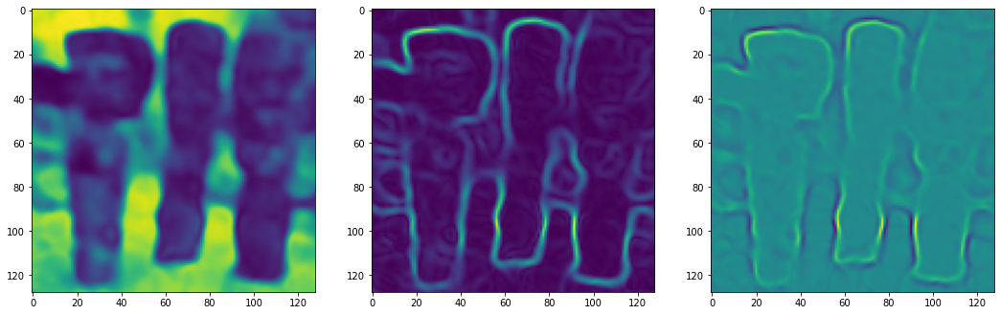

Step 50, Total loss 0.023857


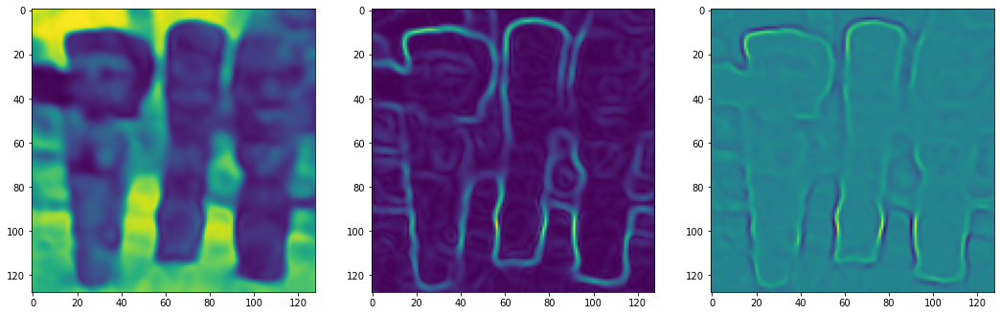

Step 60, Total loss 0.020251


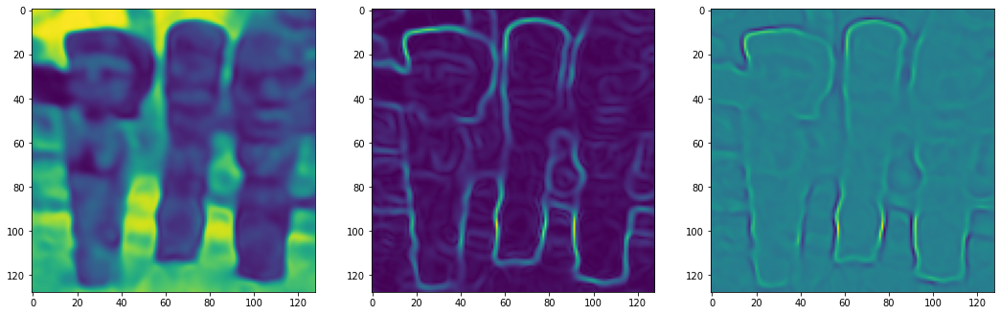

Step 70, Total loss 0.017607


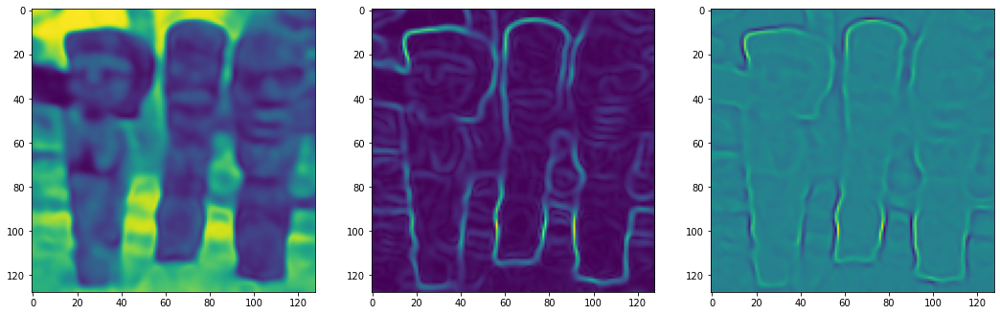

Step 80, Total loss 0.015558


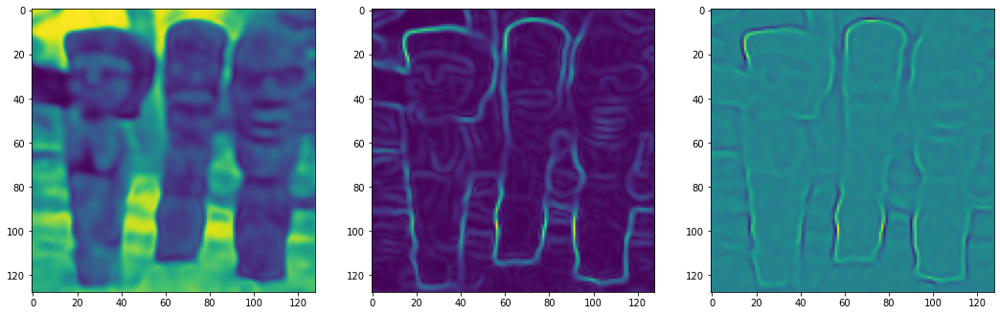

Step 90, Total loss 0.013948


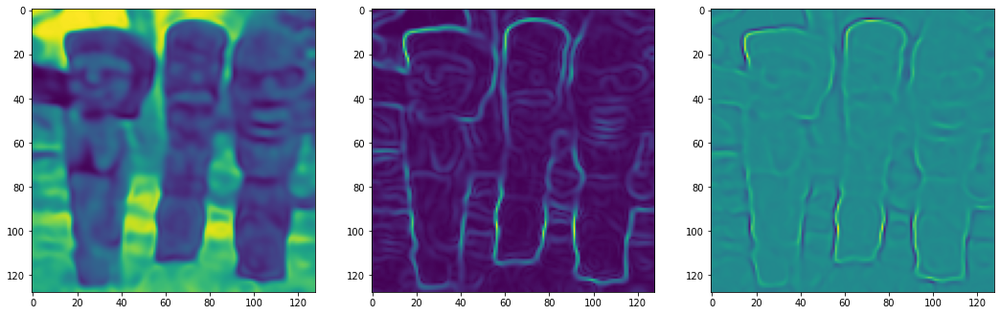

Step 100, Total loss 0.012653


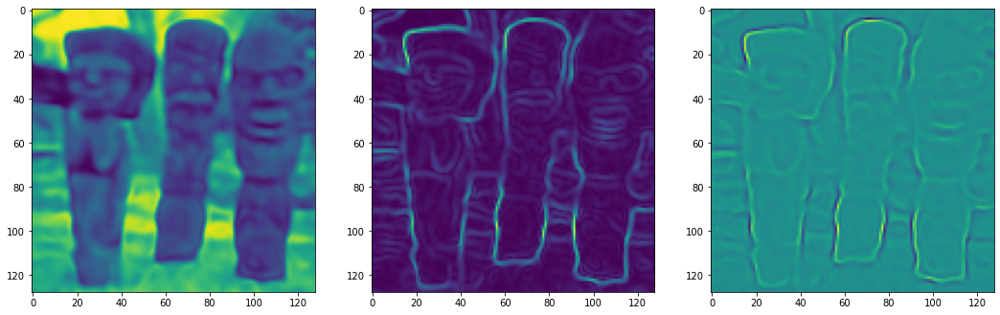

Step 110, Total loss 0.011581


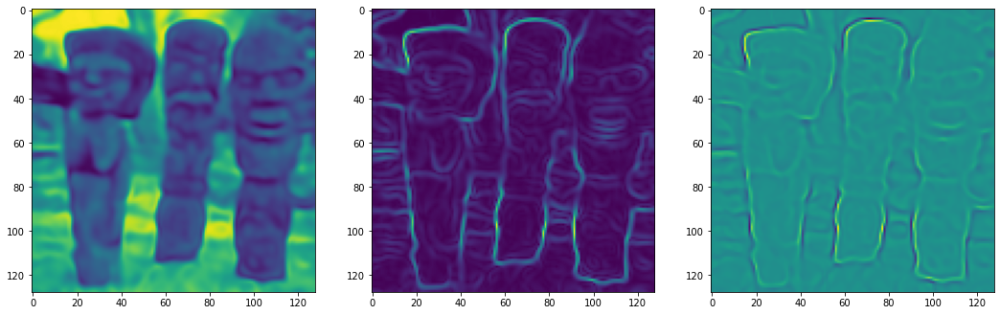

Step 120, Total loss 0.010672


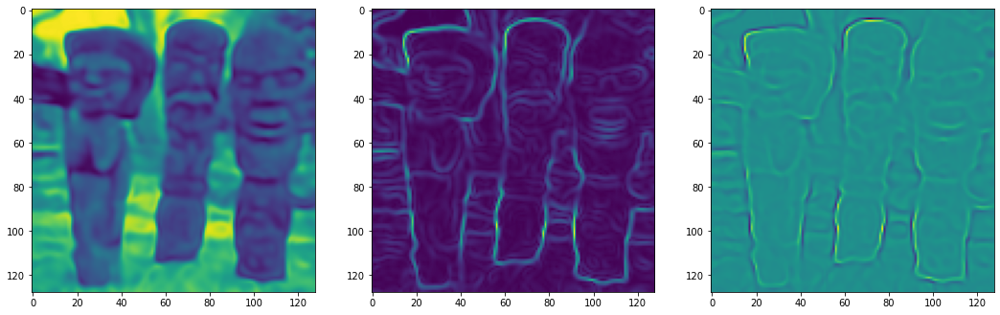

Step 130, Total loss 0.009889


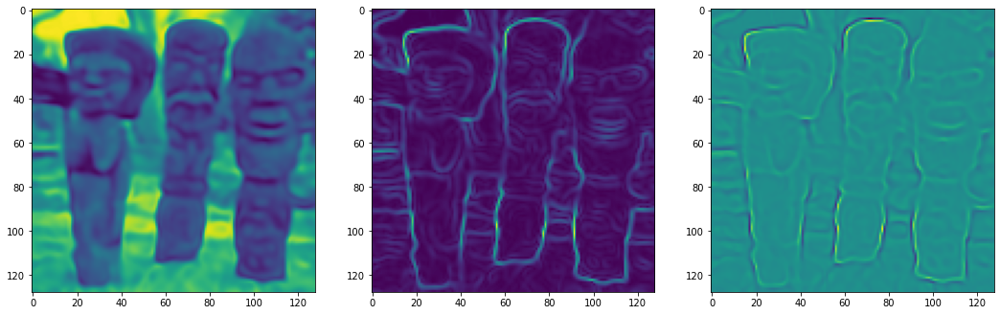

Step 140, Total loss 0.009212


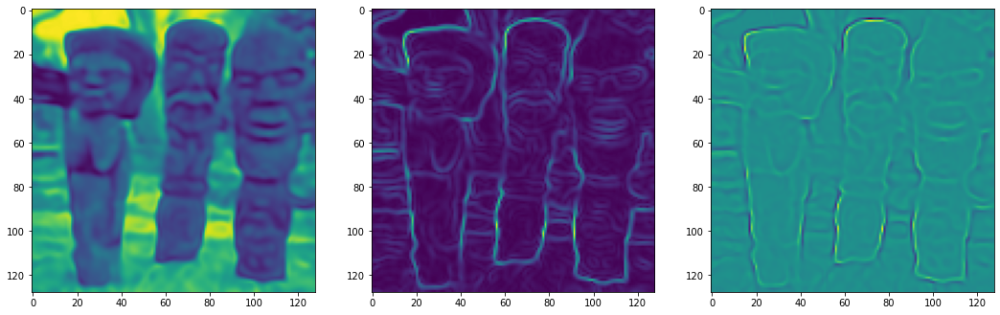

Step 150, Total loss 0.008624


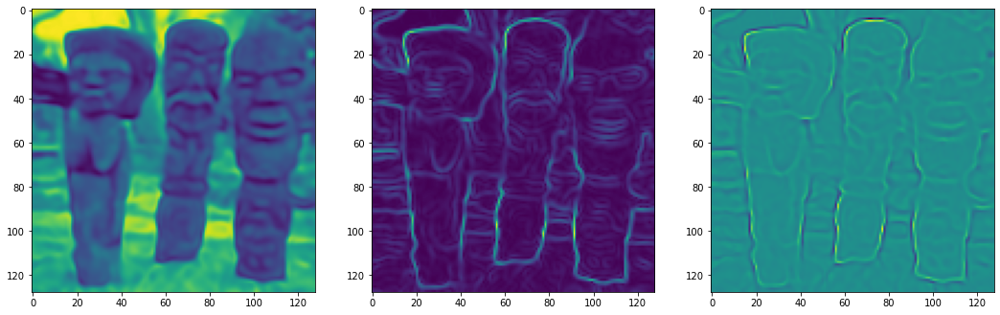

Step 160, Total loss 0.008110


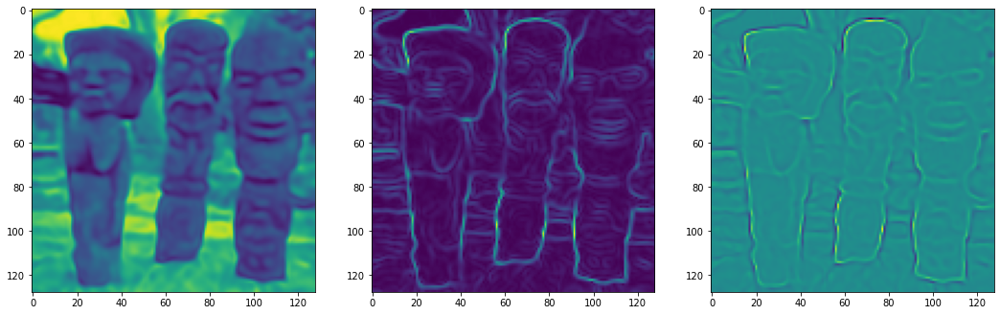

Step 170, Total loss 0.007652


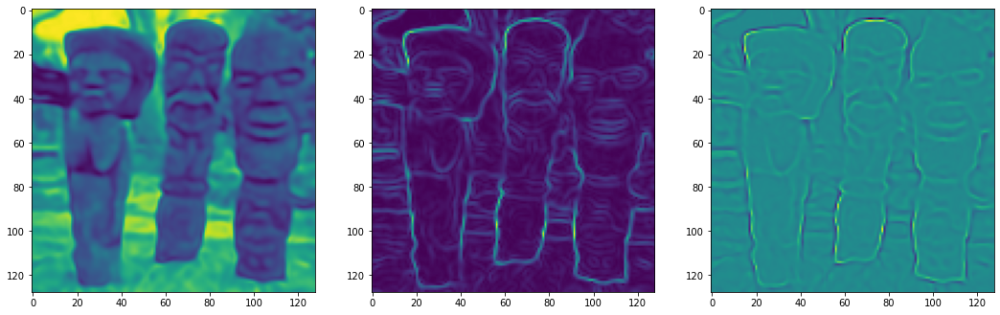

Step 180, Total loss 0.007239


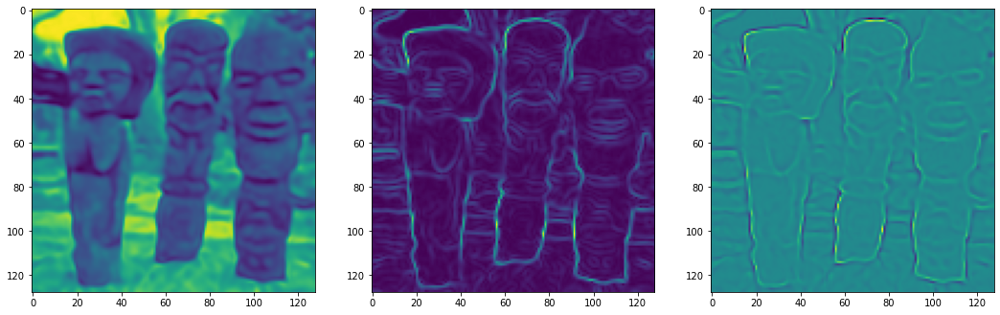

Step 190, Total loss 0.006862


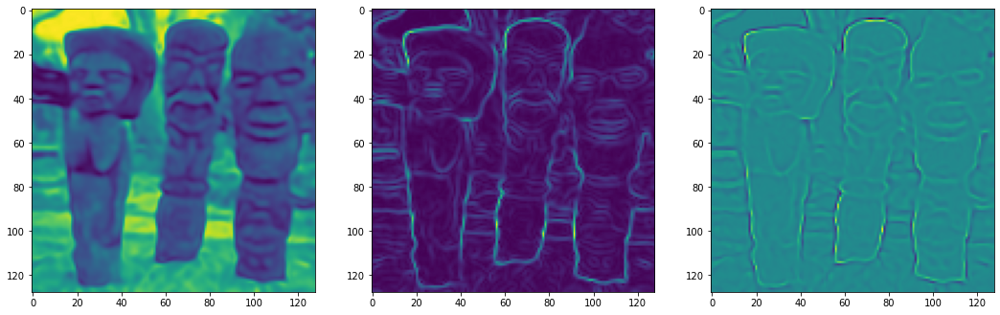

Step 200, Total loss 0.006512


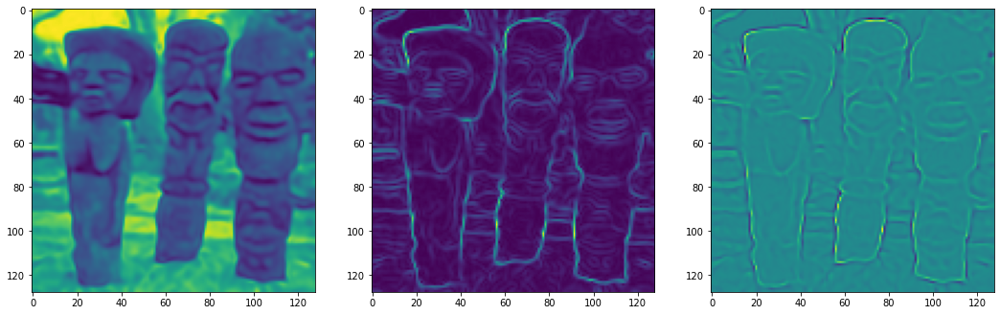

Step 210, Total loss 0.006187


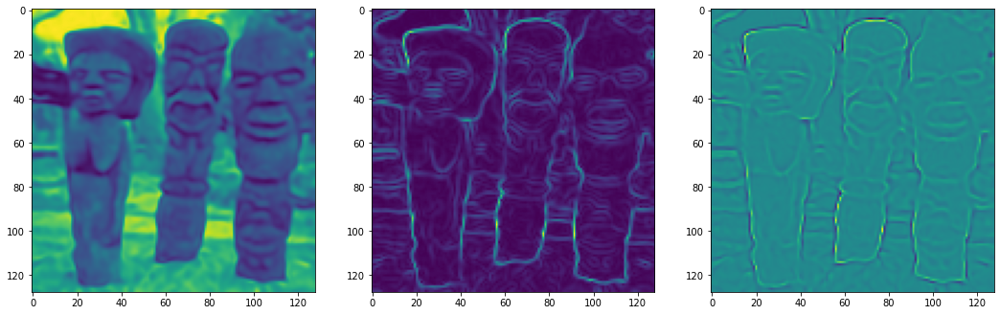

Step 220, Total loss 0.005883


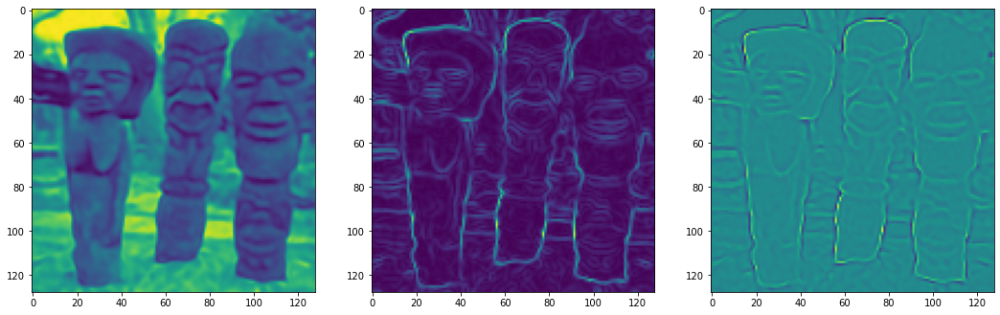

Step 230, Total loss 0.005596


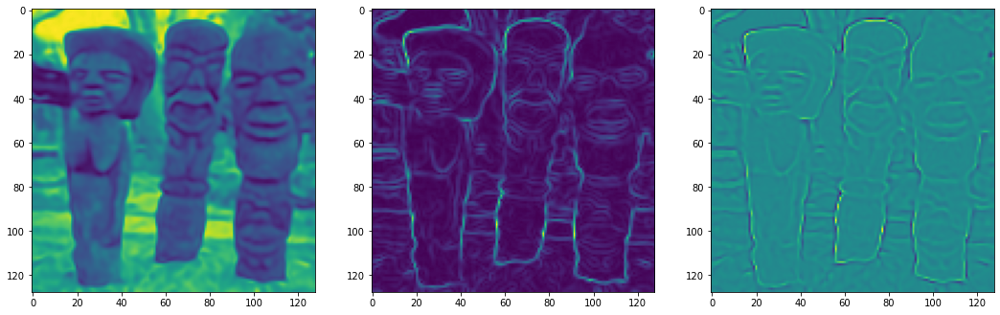

Step 240, Total loss 0.005326


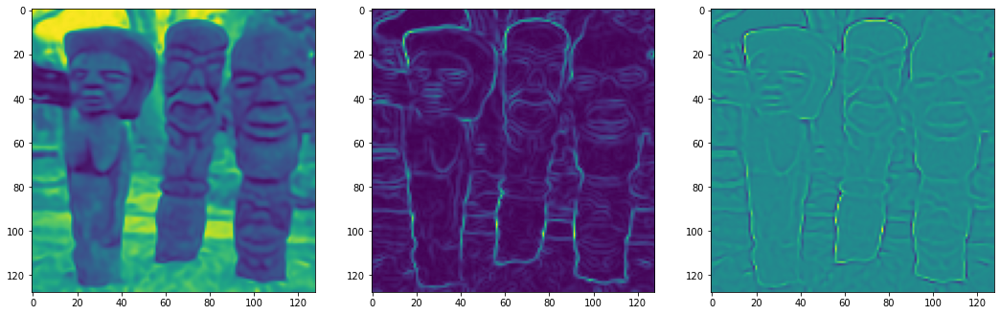

Step 250, Total loss 0.005070


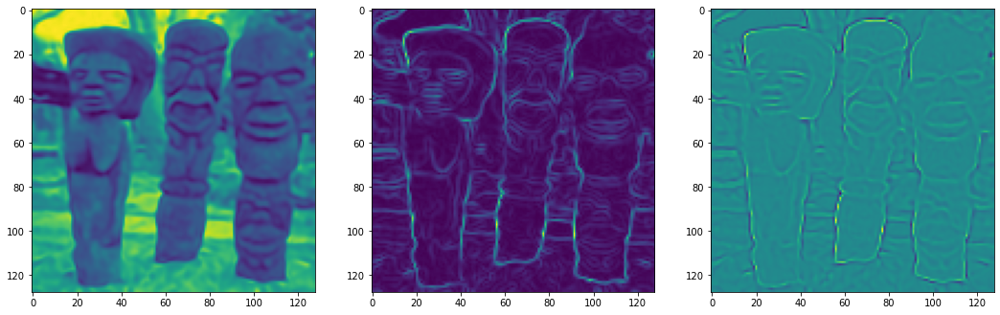

Step 260, Total loss 0.004828


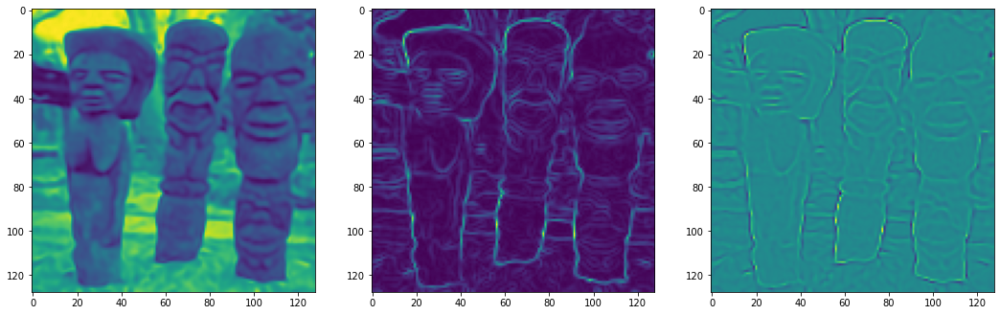

Step 270, Total loss 0.004601


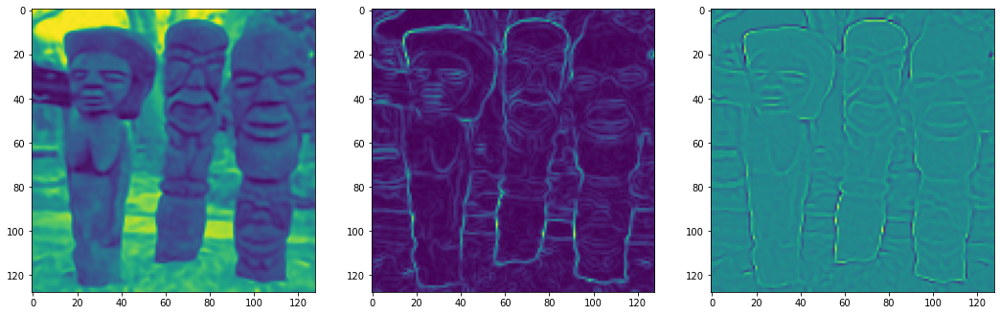

Step 280, Total loss 0.004386


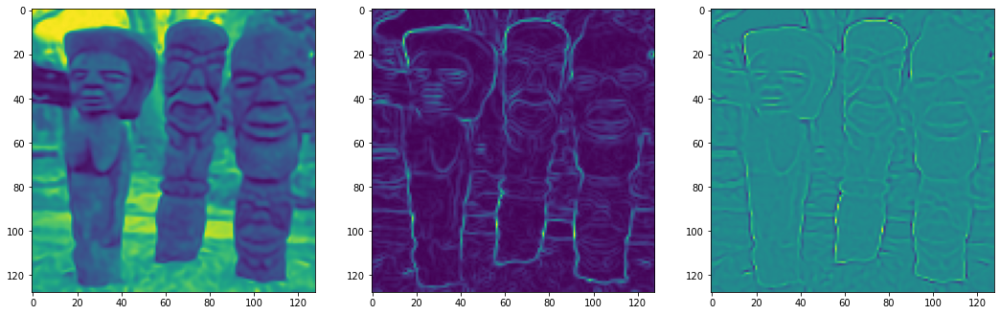

Step 290, Total loss 0.004184


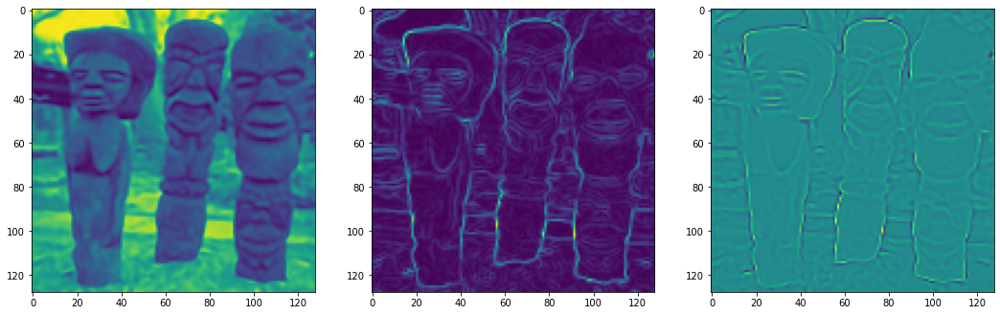

Step 300, Total loss 0.003991


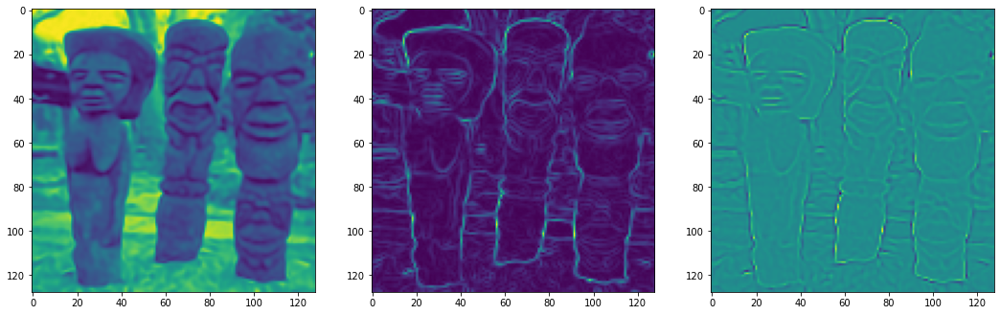

Step 310, Total loss 0.003808


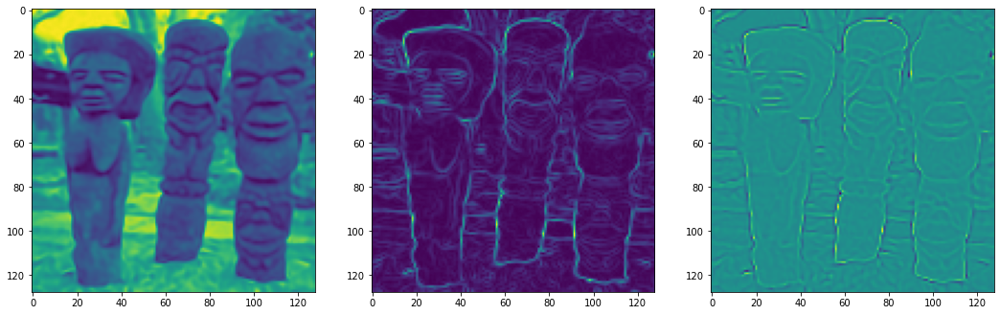

Step 320, Total loss 0.003634


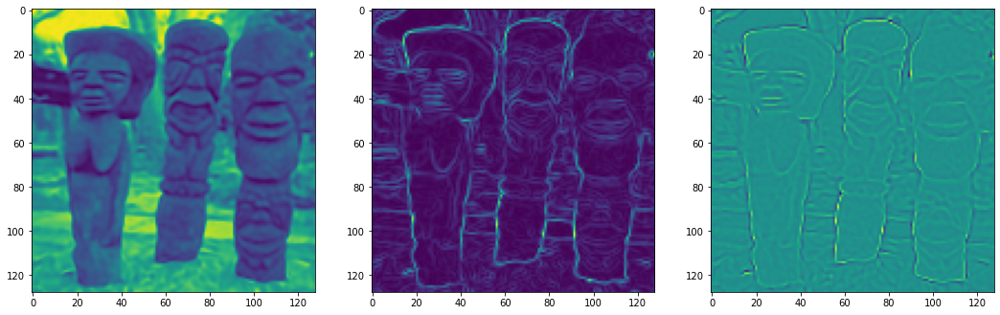

Step 330, Total loss 0.003467


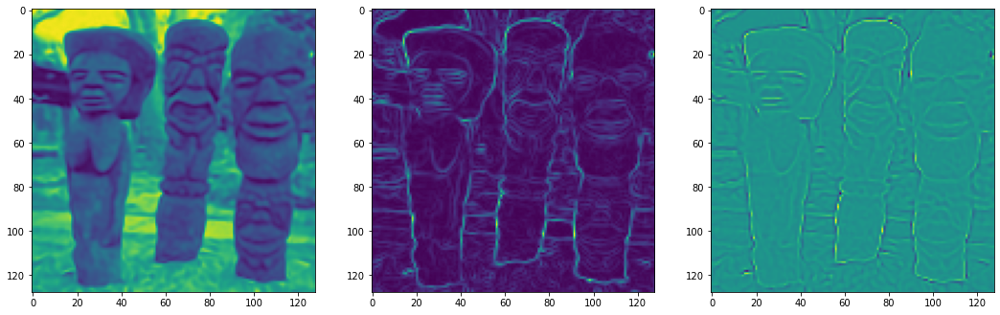

Step 340, Total loss 0.003307


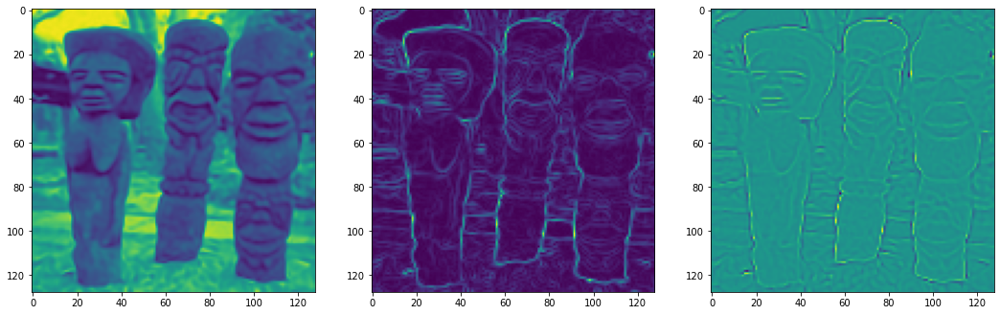

Step 350, Total loss 0.003153


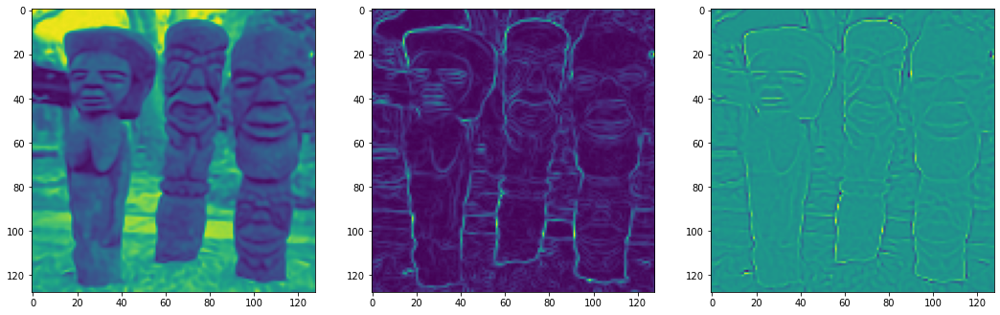

Step 360, Total loss 0.003005


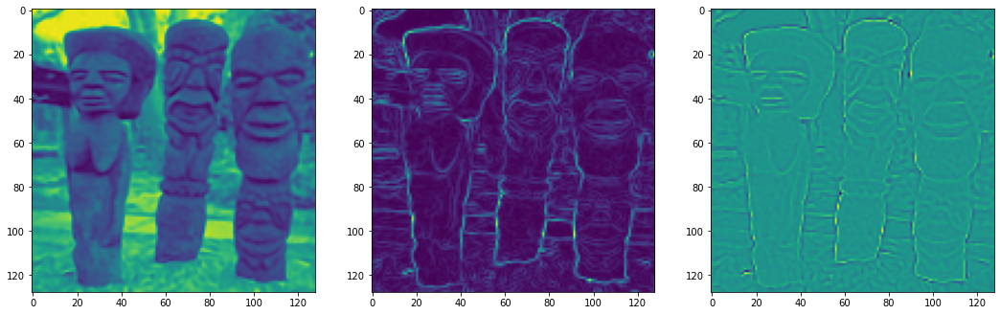

Step 370, Total loss 0.002862


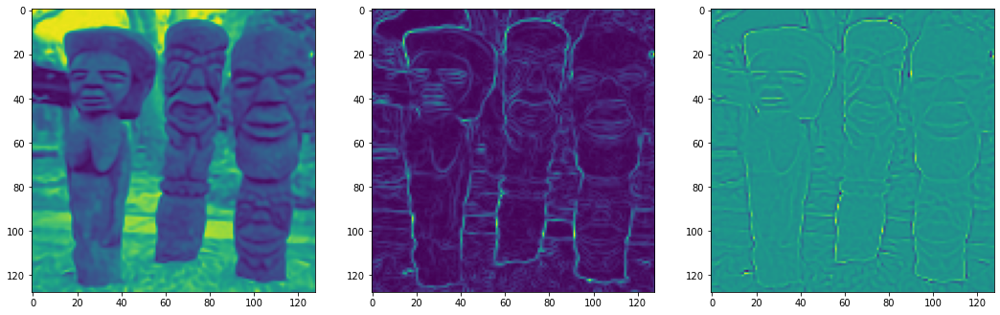

Step 380, Total loss 0.002725


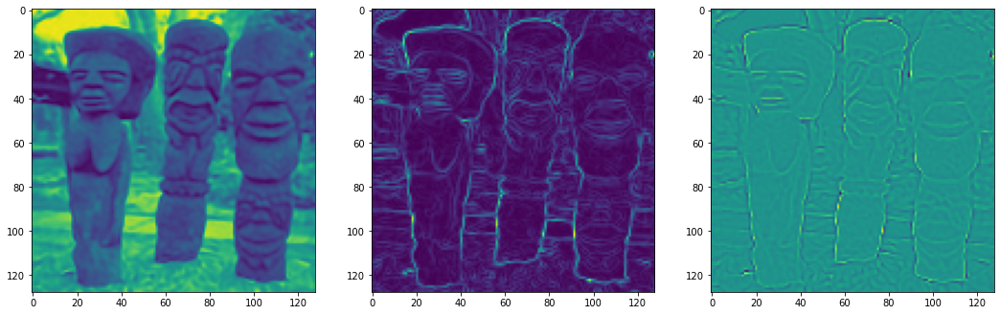

Step 390, Total loss 0.002592


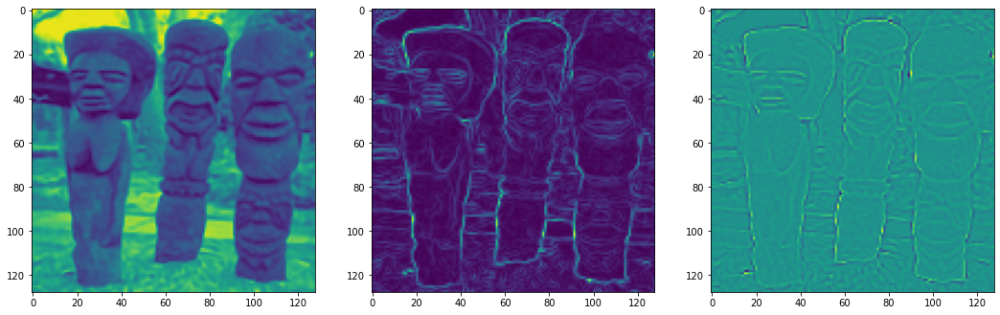

Step 400, Total loss 0.002464


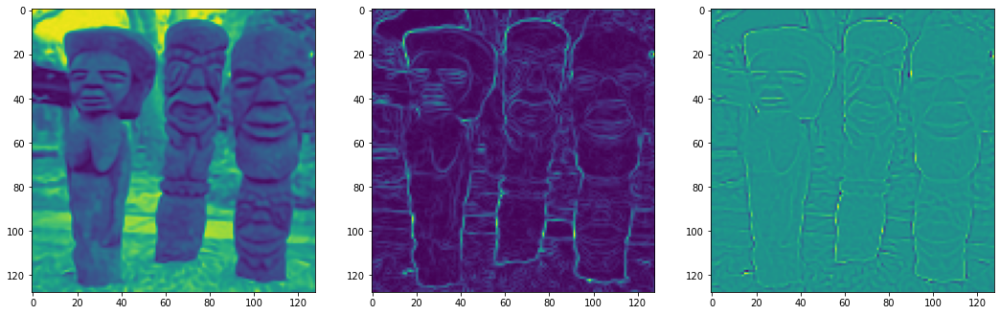

Step 410, Total loss 0.002341


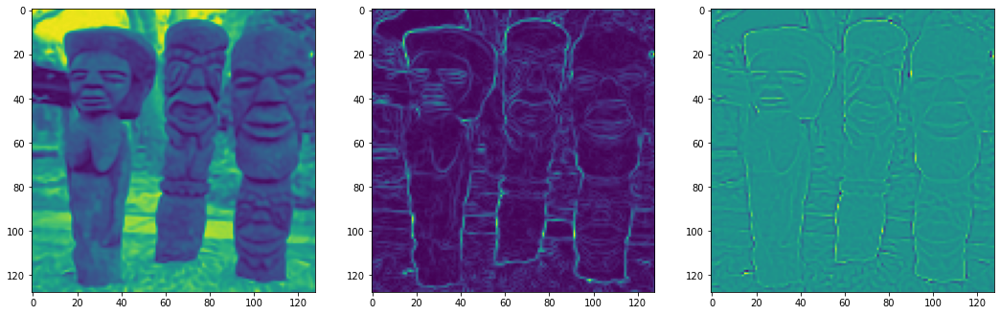

Step 420, Total loss 0.002221


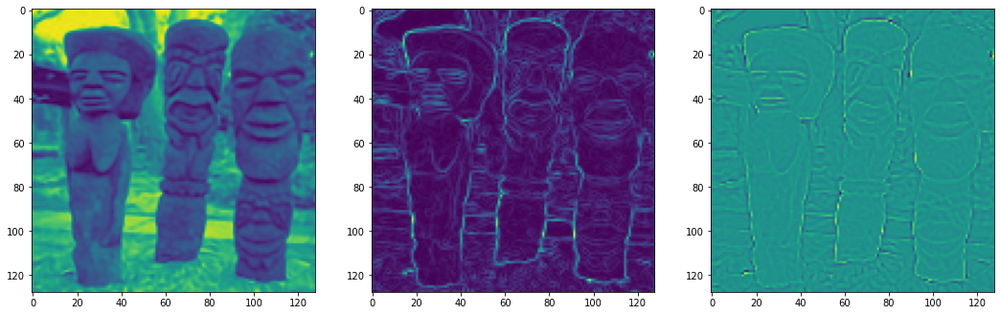

Step 430, Total loss 0.002107


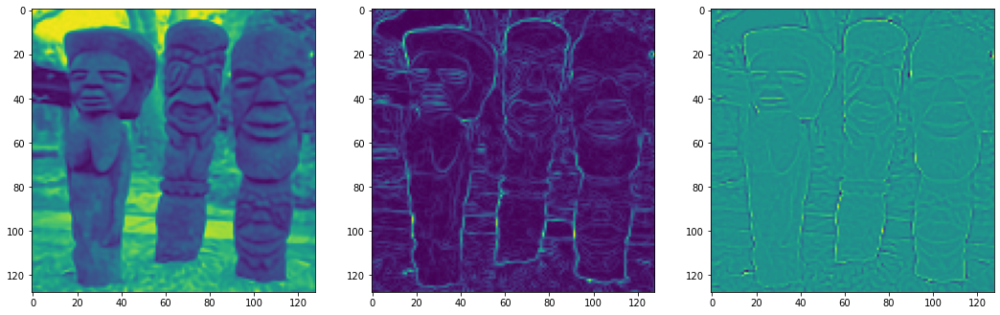

Step 440, Total loss 0.001996


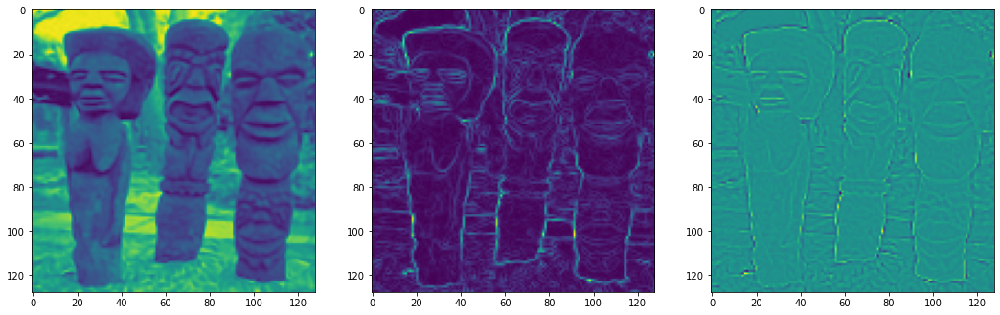

Step 450, Total loss 0.001889


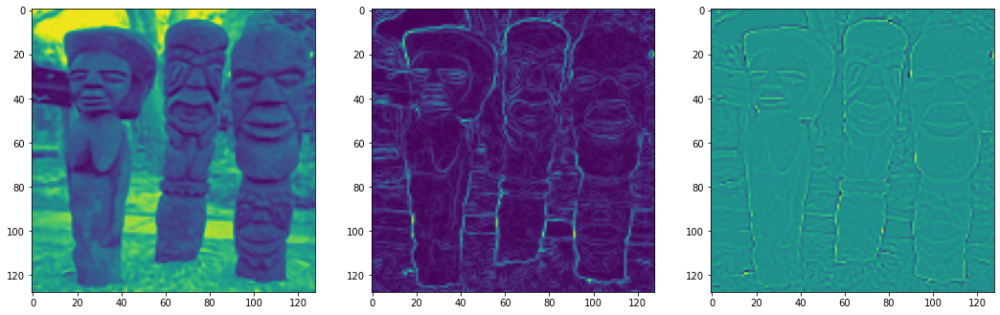

Step 460, Total loss 0.001786


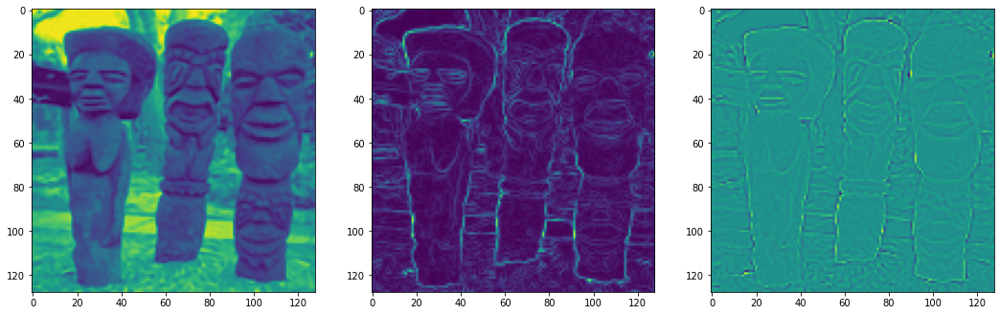

Step 470, Total loss 0.001686


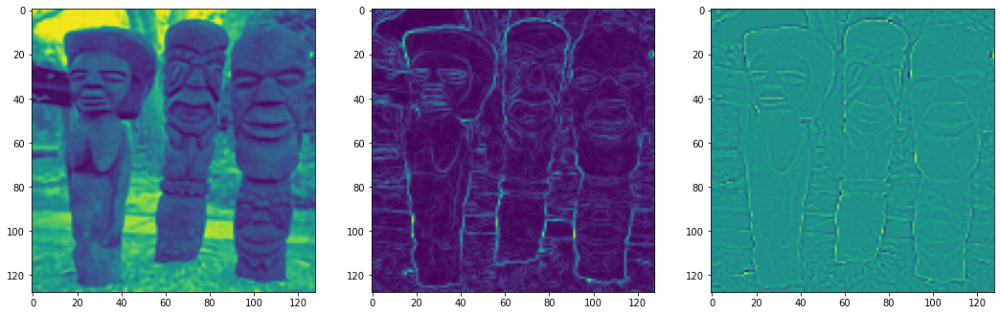

Step 480, Total loss 0.001590


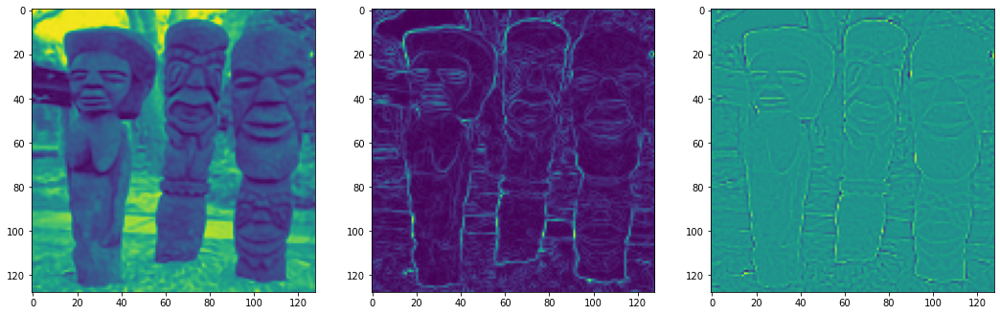

Step 490, Total loss 0.001498


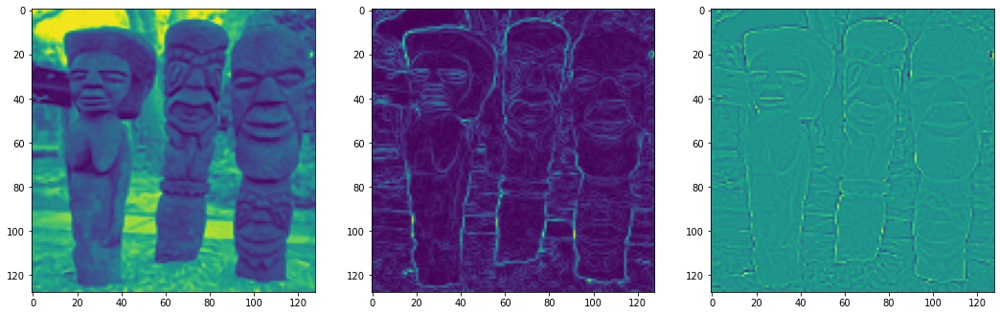

In [55]:
start = time.time()
model, history = basic_traininig_loop(
# model, history = plane_traininig_loop(
    optimizer = optim,
    criterion = criterion,
    model = img_siren,
    model_input = model_input,
    ground_truth = ground_truth,
    total_steps = total_steps, steps_til_summary = steps_til_summary)
    # total_steps = total_steps)
stop = time.time()

In [56]:
# times = (stop - start) * 1000
times = (stop - start)
print('-' * 40)
# print('Run time takes %d miliseconds' % times) # print('Run time takes %.3f seconds' % times)
print('Training complete in {:.0f}m {:.0f}s {:.0f}ms'.format(times // 60, times % 60, (times - int((times % 60))) * 1000))

----------------------------------------
Training complete in 0m 39s 533ms


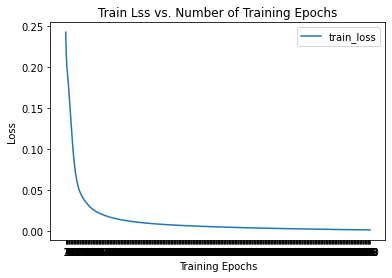

In [57]:
train_loss_h = [] # val_loss_h = []
train_loss_h = [h for h in history['train_loss']] # val_loss_h = [h for h in history['val_loss']]

plt.title("Train Lss vs. Number of Training Epochs")
plt.xlabel("Training Epochs")
plt.ylabel("Loss")
plt.plot(range(1,total_steps+1), train_loss_h, label="train_loss") # plt.plot(range(1,total_steps+1), val_acc_h, label="val_loss")
# plt.ylim((0,1.))
plt.xticks(np.arange(1, total_steps+1, 1.0))
plt.legend()
plt.show()

In [58]:
data_path = '/content/'
torch.save(model.state_dict(), data_path + 'siren{}_nn_weights.pt'.format(sidelength))

In [59]:
train_loss_h[-1].item()

0.0014171956572681665